In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve,auc

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from collections import Counter

from catboost import CatBoostClassifier
from xgboost import XGBClassifier

import keras
from keras import models
from keras import layers
import tensorflow as tf
from keras.backend import binary_crossentropy
from keras import backend as K
from keras.callbacks import Callback
from keras import optimizers
from keras.backend import mean
from keras import regularizers
from keras.layers import Dropout
from keras.layers import BatchNormalization
from keras.models import load_model

import warnings
warnings.filterwarnings('ignore')

Using TensorFlow backend.


In [2]:
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.Session(config=config)
K.clear_session()

W1008 00:21:34.048344 140144863389504 deprecation_wrapper.py:119] From /usr/local/lib/python3.7/dist-packages/keras/backend/tensorflow_backend.py:95: The name tf.reset_default_graph is deprecated. Please use tf.compat.v1.reset_default_graph instead.

W1008 00:21:34.049825 140144863389504 deprecation_wrapper.py:119] From /usr/local/lib/python3.7/dist-packages/keras/backend/tensorflow_backend.py:98: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.

W1008 00:21:34.053057 140144863389504 deprecation_wrapper.py:119] From /usr/local/lib/python3.7/dist-packages/keras/backend/tensorflow_backend.py:102: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.



# Reading Data

In [3]:
path = '/home/ricardo/TCC/'

In [4]:
df = pd.read_csv(path+'train.csv', sep = ',')
X = df.loc[:,'var_0':'var_199']
Y = df.loc[:,'target']

In [5]:
df.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


# Normalazing Data

In [6]:
meanX = X.mean(axis = 0)
stdX = X.std(axis = 0)
X_norm = (X-meanX)/stdX

# Separating the Data in anomaly and not anomaly

In [7]:
fraud_index = np.where(Y==1)
honest_index = np.where(Y==0)
fraud = X_norm.loc[fraud_index]
honest = X_norm.loc[honest_index]

yh = Y.loc[honest_index]
yf = Y.loc[fraud_index]

# Balanced Data

### Verifying how unbalanced is our dataset

Text(0.5, 1.0, '8.951238929246692')

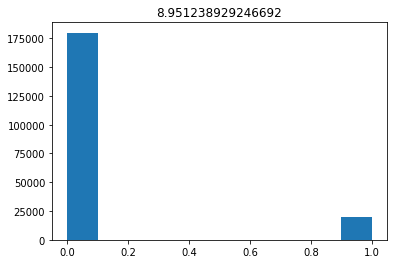

In [8]:
plt.hist(Y)
plt.title(len(yh)/len(yf))

### To balance the data we will eliminate some not anomaly samples

In [9]:
h_used, x_trash, yh, y_trash = train_test_split(honest, yh, test_size = 0.75, random_state = 30)
x_used = pd.concat([h_used,fraud],ignore_index = False)
y_used = pd.concat([yh,yf],ignore_index=False)

### Verifying if it is balanced now

Text(0.5, 1.0, '2.2377848542143495')

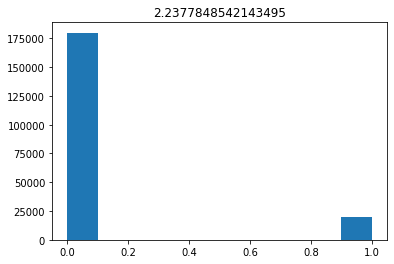

In [10]:
plt.hist(Y)
plt.title(len(yh)/len(yf))

# Separating in Train, Val and Test data

In [11]:
x_train,x_test,y_train,y_test = train_test_split(x_used,y_used,test_size=0.3,random_state = 30)
x_val,x_test,y_val,y_test = train_test_split(x_test,y_test,test_size=0.5,random_state = 30)

In [12]:
x_data = [x_train,x_val,x_test]
y_data = [y_train,y_val,y_test]

### Verifying the size of each dataframe

In [13]:
print('Size of Train Data: {0}, not anomalys/anomaly:{1}'.format(len(x_data[0]),Counter(y_data[0])))
print('Size of val Data: {0}, not anomalys/anomaly:{1}'.format(len(x_data[1]),Counter(y_data[1])))
print('Size of test Data: {0}, not anomalys/anomaly:{1}'.format(len(x_data[2]),Counter(y_data[2])))

Size of Train Data: 45551, not anomalys/anomaly:Counter({0: 31412, 1: 14139})
Size of val Data: 9761, not anomalys/anomaly:Counter({0: 6779, 1: 2982})
Size of test Data: 9761, not anomalys/anomaly:Counter({0: 6784, 1: 2977})


# Importing some metrics to evaluating the models.

In [14]:
def f1Score(y_true, y_pred):
    def recall(y_true, y_pred):
        """Recall metric.

        Only computes a batch-wise average of recall.

        Computes the recall, a metric for multi-label classification of
        how many relevant items are selected.
        """
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

    def precision(y_true, y_pred):
        """Precision metric.

        Only computes a batch-wise average of precision.

        Computes the precision, a metric for multi-label classification of
        how many selected items are relevant.
        """
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision
    precision = precision(y_true, y_pred)
    recall = recall(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [15]:
from sklearn.utils.multiclass import unique_labels
from sklearn.metrics import confusion_matrix
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

# Here we have 3 differents model, each of them will make a especific work:

- The best non anomaly predictor.
- The best anomaly predictor.
- Balanced predictor.

In [16]:
xgb = XGBClassifier()
xgb.load_model(path+'Undersampling/Boost/models/XGBoostClassifier')

RNA5 = load_model(path+'Undersampling/models/RNA5/RNA5.h5', custom_objects={'f1Score': f1Score})

catBoost = CatBoostClassifier()
catBoost.load_model(path+'/Undersampling/Boost/models/CatBoostClassifier')

W1008 00:21:43.113397 140144863389504 deprecation_wrapper.py:119] From /usr/local/lib/python3.7/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W1008 00:21:43.115868 140144863389504 deprecation_wrapper.py:119] From /usr/local/lib/python3.7/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W1008 00:21:43.141804 140144863389504 deprecation.py:506] From /usr/local/lib/python3.7/dist-packages/keras/backend/tensorflow_backend.py:3445: calling dropout (from tensorflow.python.ops.nn_ops) with keep_prob is deprecated and will be removed in a future version.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
W1008 00:21:43.319560 140144863389504 deprecation_wrapper.py:119] From /usr/local/lib/python3.7/dist-packages/keras/optimizers.py:790: The name tf.tra

In [17]:
RNA5.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 100)               20100     
_________________________________________________________________
dropout_1 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 100)               10100     
_________________________________________________________________
dropout_2 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 100)               10100     
_________________________________________________________________
dropout_3 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 101       
Total para

## To make an algorithm do some especific job, you need to change the threshold and analyse the results.

In [18]:
def choosing_threshold(y_true,y_prob,threshold_list):
    y_hat = []
    precision = []
    recall = []
    f1 = []
    y_h = []
    for threshold in threshold_list:
        for i in range(len(y_true)):
            if y_prob[i]>threshold:
                y_hat.append(1)
            else:
                y_hat.append(0)
        precision.append(precision_score(y_true,y_hat))
        recall.append(recall_score(y_true,y_hat))
        f1.append(f1_score(y_true,y_hat))
        y_h.append(y_hat)
        y_hat = []
    return(precision,recall,f1,y_h)                       

## XGBoostClassifier

In [19]:
threshold_list = np.arange(0,1,0.01)
prob = np.ravel(xgb.predict_proba(x_data[0])[:,1])
precision,recall,f1,yprob = choosing_threshold(y_data[0],prob,threshold_list)

print('precision values: {}'.format(precision))
print('recall values: {}'.format(recall))
print('f1 values: {}'.format(f1))

precision values: [0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.3104061470911087, 0.3104265923112389, 0.31044704022483754, 0.3104879441345689, 0.31055614127569847, 0.31064484235966167, 0.31078140454995057, 0.31103436138853446, 0.3113151463108528

Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized co

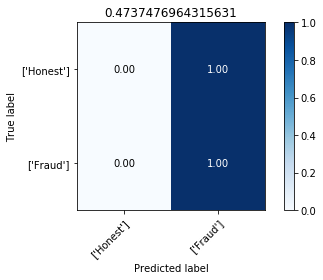

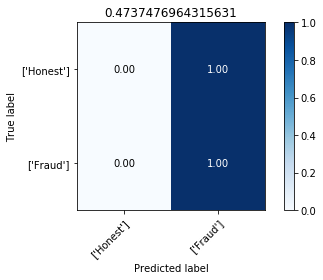

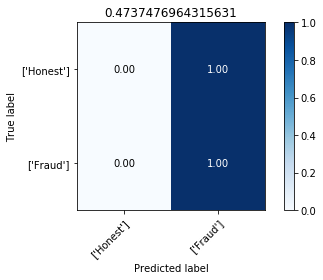

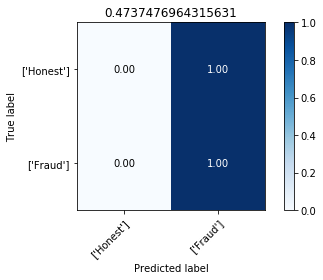

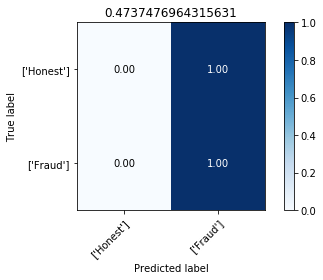

...

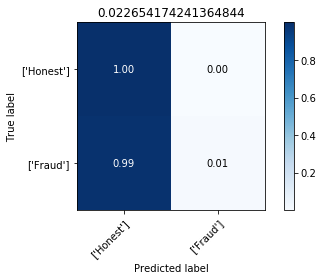

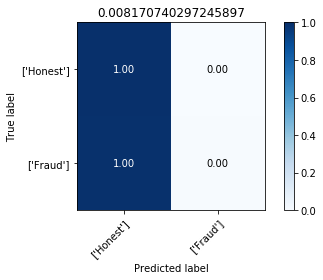

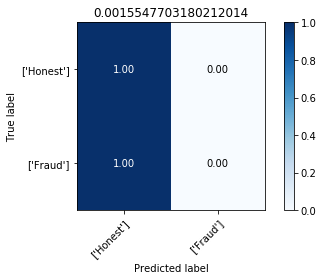

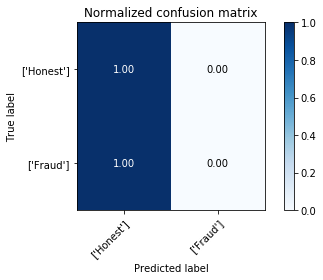

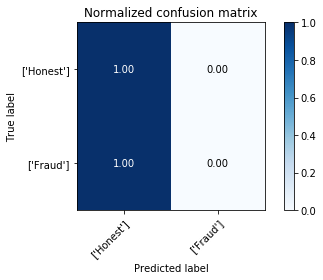

In [20]:
for i in range(len(yprob)):
    plot_confusion_matrix(y_data[0], yprob[i],
                          classes = np.array([['Honest'],['Fraud']]),
                          normalize=True,
                          title= f1[i],
                          cmap=plt.cm.Blues)

In [21]:
threshold_list[f1.index(0.6063446776713539)]

0.6900000000000001

In [22]:
threshold = []
threshold.append(threshold_list[f1.index(0.6063446776713539)])

# CatBoostClassifier

In [23]:
threshold_list = np.arange(0,1,0.01)
prob = np.ravel(catBoost.predict_proba(x_data[0])[:,1])
precision,recall,f1,yprob = choosing_threshold(y_data[0],prob,threshold_list)

print('precision values: {}'.format(precision))
print('recall values: {}'.format(recall))
print('f1 values: {}'.format(f1))

precision values: [0.31039933261618846, 0.31166512366089144, 0.319371964305885, 0.33137981152421586, 0.34494467107995214, 0.3604802656788862, 0.3762415892342198, 0.39369946562963376, 0.4106208146913472, 0.4280216255841657, 0.44468491406747296, 0.46122002914293286, 0.47741025993673497, 0.4946005864263749, 0.5100099914887318, 0.5260029147810079, 0.5411829959193376, 0.5565925743992796, 0.5717364662130753, 0.586991586381272, 0.6024621467403514, 0.6173639392817475, 0.6318673464525659, 0.6458170062695925, 0.659624886558435, 0.6733119304059652, 0.6867732172250837, 0.698792559556184, 0.7109514260249554, 0.723185759926974, 0.7355260851784775, 0.7486666267154072, 0.7602428851815506, 0.7697801165194512, 0.7806736680327869, 0.7892121608368748, 0.7990919409761634, 0.8103236378533388, 0.818733012753502, 0.8287139294620591, 0.8379912663755459, 0.8462336892052195, 0.8529700354743754, 0.8597396595548025, 0.8689362371255602, 0.8766870179948586, 0.8842778643483966, 0.8905176746523705, 0.8966549747625974,

Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0.00588947 0.99411053]
 [0.         1.        ]]
Normalized confusion matrix
[[4.08760983e-02 9.59123902e-01]
 [1.41452719e-04 9.99858547e-01]]
Normalized confusion matrix
[[9.20030562e-02 9.07996944e-01]
 [2.12179079e-04 9.99787821e-01]]
Normalized confusion matrix
[[0.14631351 0.85368649]
 [0.00127307 0.99872693]]
Normalized confusion matrix
[[0.20304342 0.79695658]
 [0.00198034 0.99801966]]
Normalized confusion matrix
[[0.25630332 0.74369668]
 [0.00339487 0.99660513]]
Normalized confusion matrix
[[0.31010442 0.68989558]
 [0.00473867 0.99526133]]
Normalized confusion matrix
[[0.35836623 0.64163377]
 [0.00686046 0.99313954]]
Normalized confusion matrix
[[0.4038584  0.5961416 ]
 [0.00891152 0.99108848]]
Normalized confusion matrix
[[0.44454349 0.55545651]
 [0.0118113  0.9881887 ]]
Normalized confusion matrix
[[0.48207691 0.51792309]
 [0.01499399 0.98500601]]
Normalized confusion matrix
[[0.51614033 0.48385967]

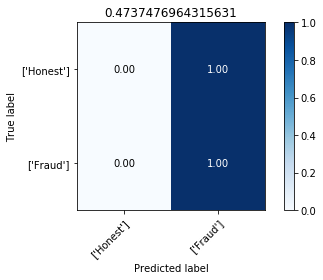

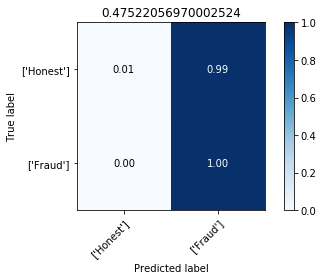

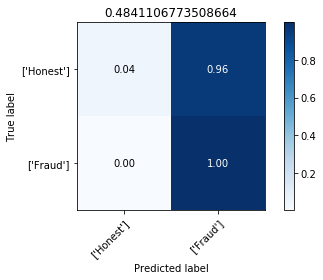

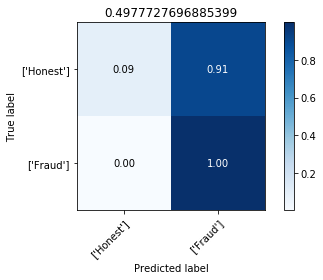

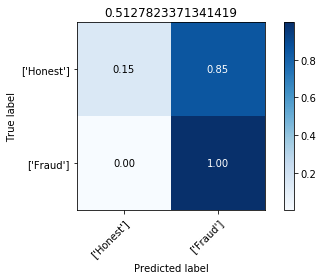

...

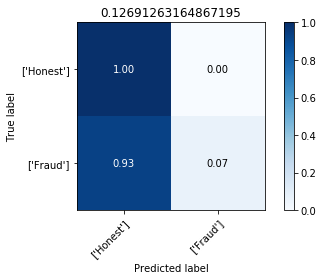

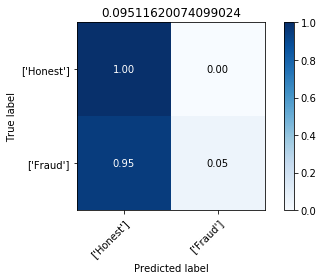

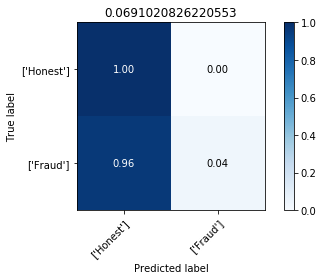

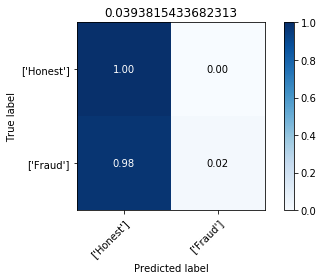

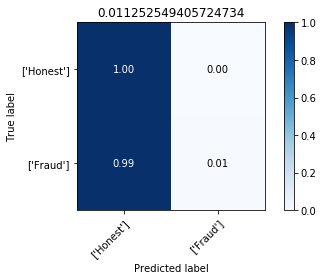

In [24]:
for i in range(len(yprob)):
    plot_confusion_matrix(y_data[0], yprob[i],
                          classes = np.array([['Honest'],['Fraud']]),
                          normalize=True,
                          title= f1[i],
                          cmap=plt.cm.Blues)

In [25]:
threshold_list[f1.index(max(f1))]

0.41000000000000003

In [26]:
threshold.append(threshold_list[f1.index(max(f1))])

## RNA5


In [27]:
threshold_list = np.arange(0,1,0.01)
prob = np.ravel(RNA5.predict(x_data[0]))
precision,recall,f1,yprob = choosing_threshold(y_data[0],prob,threshold_list)

In [28]:
print('precision values: {}'.format(precision))
print('recall values: {}'.format(recall))
print('f1 values: {}'.format(f1))

precision values: [0.31039933261618846, 0.31246961057331035, 0.3292657318182879, 0.34831516352824576, 0.36748856526996476, 0.38467290754999167, 0.4013131137063506, 0.41519900572918245, 0.42755972427685623, 0.43926179977135393, 0.45155615696887685, 0.4614124372559955, 0.4726965524679153, 0.4829513901743734, 0.49277291745910995, 0.5026188242651657, 0.5118722926359698, 0.5205029172487469, 0.5282415779955419, 0.5371408851695281, 0.543925315954027, 0.5508543165467625, 0.5592247278739724, 0.567138224373737, 0.5754866618601298, 0.5839642119752236, 0.5903094748457641, 0.597379331524799, 0.603702737940026, 0.6108505649115327, 0.6173000598053607, 0.6243406806951307, 0.6311247374098677, 0.6378153205276557, 0.6434592937570005, 0.6494325346784363, 0.6545043393228211, 0.6598541965231478, 0.6663701067615658, 0.6723691031622603, 0.6790980625537261, 0.6841536695699143, 0.6884930187770824, 0.694125070106562, 0.7010869565217391, 0.7079523008266881, 0.7133467772051684, 0.7184621240959269, 0.72398506766215

Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[9.67783013e-03 9.90322170e-01]
 [7.07263597e-05 9.99929274e-01]]
Normalized confusion matrix
[[0.08484019 0.91515981]
 [0.00190961 0.99809039]]
Normalized confusion matrix
[[0.16267668 0.83732332]
 [0.00572884 0.99427116]]
Normalized confusion matrix
[[0.23398701 0.76601299]
 [0.01124549 0.98875451]]
Normalized confusion matrix
[[0.29272253 0.70727747]
 [0.01768159 0.98231841]]
Normalized confusion matrix
[[0.34394499 0.65605501]
 [0.02298607 0.97701393]]
Normalized confusion matrix
[[0.38583981 0.61416019]
 [0.03126105 0.96873895]]
Normalized confusion matrix
[[0.42101745 0.57898255]
 [0.03925313 0.96074687]]
Normalized confusion matrix
[[0.45348911 0.54651089]
 [0.04887191 0.95112809]]
Normalized confusion matrix
[[0.48389151 0.51610849]
 [0.05594455 0.94405545]]
Normalized confusion matrix
[[0.50811792 0.49188208]
 [0.06379518 0.93620482]]
Normalized confusion matrix
[[0.5330447 0.4669553]
 [0.0700191 0.929

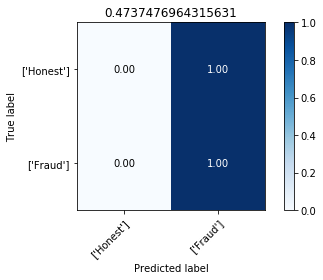

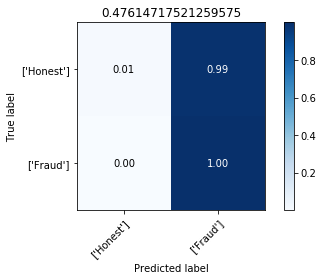

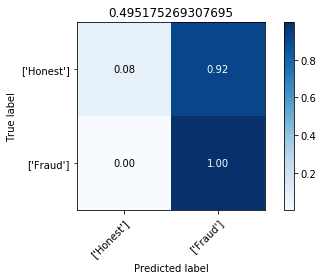

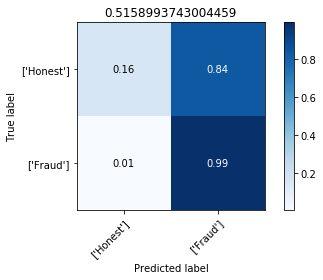

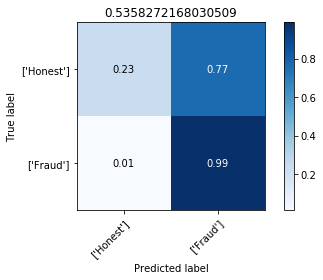

...

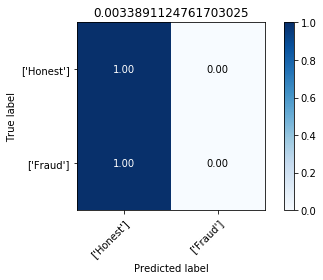

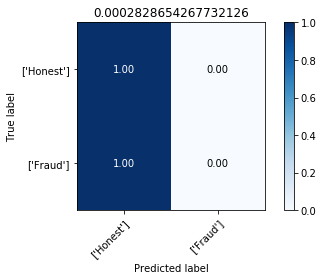

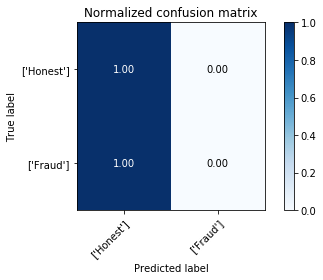

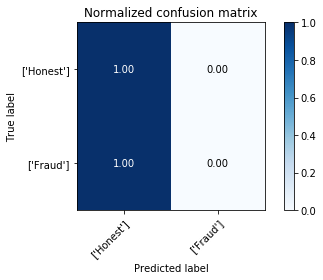

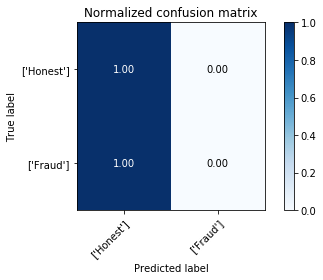

In [29]:
for i in range(len(yprob)):
    plot_confusion_matrix(y_data[0], yprob[i],
                          classes = np.array([['Honest'],['Fraud']]),
                          normalize=True,
                          title= f1[i],
                          cmap=plt.cm.Blues)

In [30]:
threshold_list[f1.index(0.6445573233701356)]

0.6

In [31]:
threshold.append(threshold_list[f1.index(0.6445573233701356)])

# After make the analysis and choose one specific threshold for each one, we will define a new DataFrame

- ## So Lets make the preditions with the thresholds

In [32]:
y_hat_cat = []
y_hat_xgb = []
y_hat_rna = []

y_prob_cat = []
y_prob_xgb = []
y_prob_rna = []

In [33]:
def predict_threshold(y_prob,threshold):
    y_hat = []
    for i in range(len(y_prob)):
        if y_prob[i]>threshold:
            y_hat.append(1)
        else:
            y_hat.append(0)
    return y_hat

In [34]:
for i in range(len(x_data)):
    y_prob_xgb.append(np.ravel(xgb.predict_proba(x_data[i])[:,1]))
    y_hat_xgb.append(predict_threshold(y_prob_xgb[i],threshold[0])) 

    y_prob_cat.append(np.ravel(catBoost.predict_proba(x_data[i])[:,1]))
    y_hat_cat.append(predict_threshold(y_prob_cat[i],threshold[1]))

    y_prob_rna.append(np.ravel(RNA5.predict(x_data[i])))
    y_hat_rna.append(predict_threshold(y_prob_rna[i],threshold[2]))

- ## Build a new DataFrame with the answers

In [35]:
new_data = [np.vstack((y_hat_xgb[0],y_prob_xgb[0],y_hat_cat[0],y_prob_cat[0],y_hat_rna[0],y_prob_rna[0],y_train)).T,
         np.vstack((y_hat_xgb[1],y_prob_xgb[1],y_hat_cat[1],y_prob_cat[1],y_hat_rna[1],y_prob_rna[1],y_val)).T,
         np.vstack((y_hat_xgb[2],y_prob_xgb[2],y_hat_cat[2],y_prob_cat[2],y_hat_rna[2],y_prob_rna[2],y_test)).T] 

- ## Add some new features, like the mean and the geometric mean of the probabilities

In [36]:
aux_data = []
for i in range(len(new_data)):
    aux =  pd.DataFrame(data = new_data[i], columns = ['hat_xgb','prob1_xgb','hat_cat','prob1_cat',
                                                         'hat_rna','prob1_rna','target'])
    average = pd.DataFrame(aux.iloc[:,[1,3,5]].mean(axis = 1, skipna = True),columns=['mean'])
    aux = aux.join(average.reset_index(drop=True))
    geo_mean = pd.DataFrame(np.sqrt(aux.iloc[:,[1,3,5]].prod(axis = 1, skipna = True))/
                           aux.iloc[:,[1,3,5]].sum(axis = 1, skipna = True),columns=['geo_mean'])
    aux = aux.join(geo_mean.reset_index(drop=True))
    aux['prob0_xgb'] = aux.iloc[:,1]
    aux['prob0_cat'] = 1 - aux.iloc[:,3]
    aux['prob0_rna'] = 1 - aux.iloc[:,5]                  
    aux['id'] = aux.index
    aux.set_index('id',inplace = True)
    aux = aux[['hat_xgb','prob1_xgb','prob0_xgb','hat_cat','prob1_cat','prob0_cat',
               'hat_rna','prob1_rna','prob0_rna','geo_mean','mean','target']]
    aux_data.append(aux)
new_data = aux_data
aux_data = None

In [37]:
new_data[0].head()

,hat_xgb,prob1_xgb,prob0_xgb,hat_cat,prob1_cat,prob0_cat,hat_rna,prob1_rna,prob0_rna,geo_mean,mean,target
id,,,,,,,,,,,,
0,0.0,0.657060,0.657060,0.0,0.031772,0.968228,0.0,0.058842,0.941158,0.046877,0.249225,0.0
1,0.0,0.633083,0.633083,0.0,0.029919,0.970081,0.0,0.126966,0.873034,0.062078,0.263323,0.0
2,0.0,0.687710,0.687710,1.0,0.507097,0.492903,0.0,0.253116,0.746884,0.205193,0.482641,1.0
3,1.0,0.933945,0.933945,1.0,0.980173,0.019827,1.0,0.885128,0.114872,0.321569,0.933082,1.0
4,0.0,0.653517,0.653517,0.0,0.094978,0.905022,0.0,0.085252,0.914748,0.087249,0.277916,0.0


# let's see if the F1Score of the mean and the geometric mean has a better performance than the algothms by their self.

- ## Mean of the probabilities 

In [38]:
precision,recall,f1,yprob = choosing_threshold(new_data[1]['target'],new_data[1]['mean'],np.arange(0,1,0.01))

Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[2.95028765e-04 9.99704971e-01]
 [0.00000000e+00 1.00000000e+00]]
Normalized confusion matrix
[[1.47514383e-03 9.98524856e-01]
 [3.35345406e-04 9.99664655e-01]]
Normalized confusion matrix
[[5.60554654e-03 9.94394453e-01]
 [3.35345406e-04 9.99664655e-01]]
Normalized

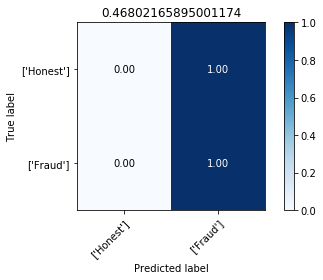

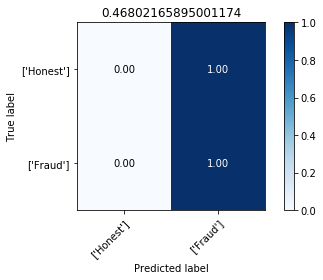

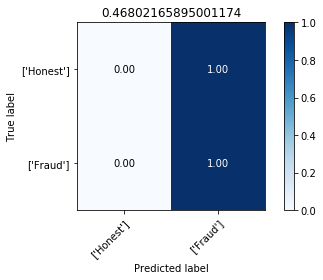

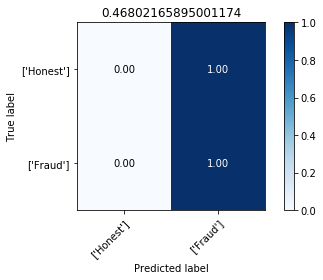

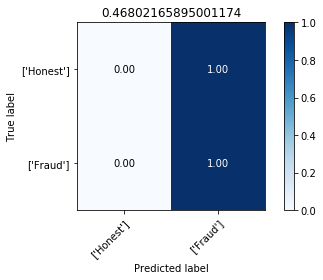

...

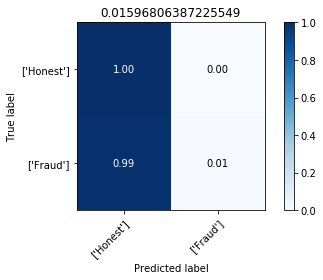

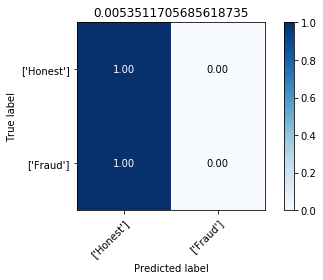

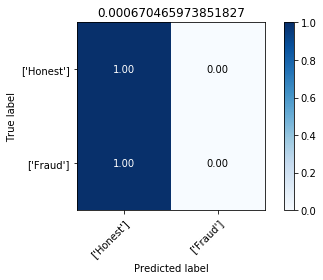

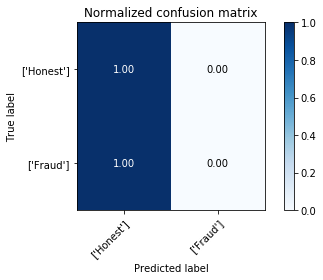

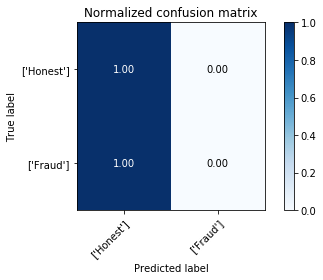

In [39]:
for i in range(len(yprob)):
    plot_confusion_matrix(y_data[1], yprob[i],
                          classes = np.array([['Honest'],['Fraud']]),
                          normalize=True,
                          title= f1[i],
                          cmap=plt.cm.Blues)

In [40]:
max(f1)

0.7171415079490006

- ## Geometric Mean of the probabilities 

In [41]:
precision,recall,f1,yprob = choosing_threshold(new_data[1]['target'],new_data[1]['geo_mean'],np.arange(0,1,0.01))

Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[8.85086296e-04 9.99114914e-01]
 [0.00000000e+00 1.00000000e+00]]
Normalized confusion matrix
[[2.37498156e-02 9.76250184e-01]
 [3.35345406e-04 9.99664655e-01]]
Normalized confusion matrix
[[0.07390471 0.92609529]
 [0.00167673 0.99832327]]
Normalized confusion matrix
[[0.13807346 0.86192654]
 [0.00335345 0.99664655]]
Normalized confusion matrix
[[0.20194719 0.79805281]
 [0.00838364 0.99161636]]
Normalized confusion matrix
[[0.2677386  0.7322614 ]
 [0.01374916 0.98625084]]
Normalized confusion matrix
[[0.32320401 0.67679599]
 [0.02079142 0.97920858]]
Normalized confusion matrix
[[0.37911196 0.62088804]
 [0.02783367 0.97216633]]
Normalized confusion matrix
[[0.4297094  0.5702906 ]
 [0.03688799 0.96311201]]
Normalized confusion matrix
[[0.47838914 0.52161086]
 [0.04661301 0.95338699]]
Normalized confusion matrix
[[0.52780646 0.47219354]
 [0.06069752 0.93930248]]
Normalized confusion matrix
[[0.57073315 0.42926685]

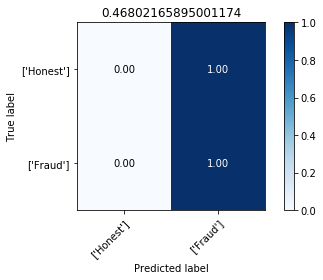

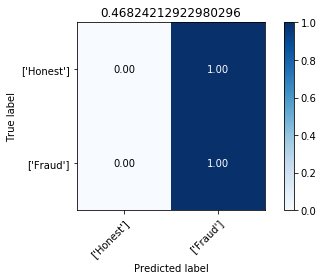

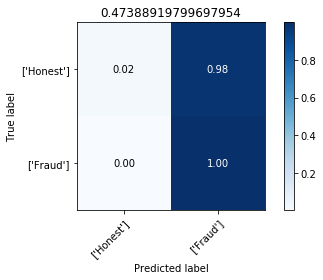

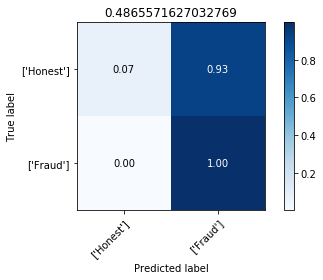

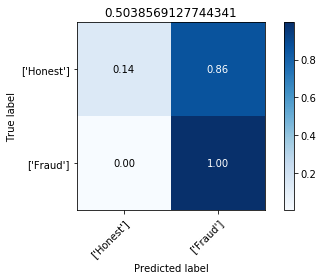

...

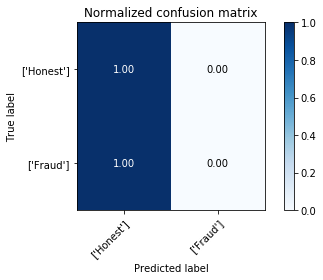

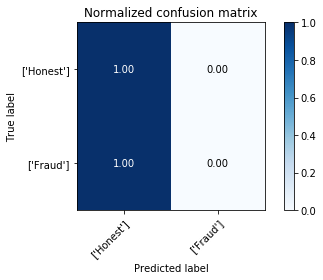

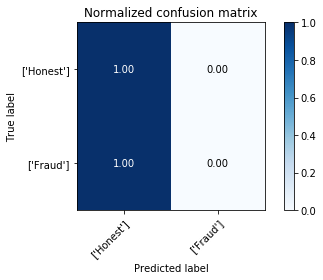

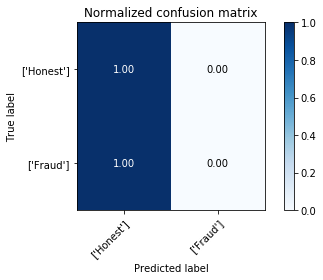

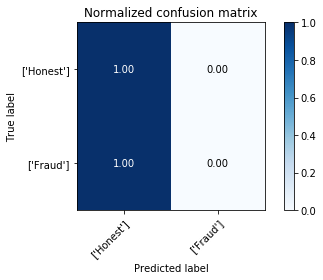

In [42]:
for i in range(len(yprob)):
    plot_confusion_matrix(y_data[1], yprob[i],
                          classes = np.array([['Honest'],['Fraud']]),
                          normalize=True,
                          title= f1[i],
                          cmap=plt.cm.Blues)

In [43]:
max(f1)

0.7172048042427078

## CatBoost has the best performance of the 3 algorithms, fot the validation data makes 71,249% at the F1 Score metric, so the mean and the geometric mean didn't has effect

# Creating a new Algorithm that will try to understand a behavior in the answer of the three others algorithm

- ## Traying a Neural Network

In [44]:
modelf = models.Sequential()
modelf.add(layers.Dense(units = 6, activation='tanh',input_shape = (11,)))
modelf.add(layers.Dense(units = 1,activation = 'sigmoid'))

modelf.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 6)                 72        
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 7         
Total params: 79
Trainable params: 79
Non-trainable params: 0
_________________________________________________________________


In [45]:
mom = optimizers.SGD(lr=0.0001, decay=0, momentum=0.9, nesterov=True)
modelf.compile(loss = 'binary_crossentropy',metrics=[f1Score],optimizer = mom)
history = modelf.fit(new_data[0].loc[:,'hat_xgb':'mean'],new_data[0]['target'],epochs = 50,batch_size=32, 
                     validation_data =(new_data[1].loc[:,'hat_xgb':'mean'],new_data[1]['target']))

Train on 45551 samples, validate on 9761 samples
Epoch 1/50
45551/45551 [==============================] - 2s 34us/step - loss: 0.5369 - f1Score: 0.6974 - val_loss: 0.4417 - val_f1Score: 0.6791
Epoch 2/50
45551/45551 [==============================] - 1s 30us/step - loss: 0.3730 - f1Score: 0.7536 - val_loss: 0.4075 - val_f1Score: 0.6888
Epoch 3/50
45551/45551 [==============================] - 1s 30us/step - loss: 0.3384 - f1Score: 0.7719 - val_loss: 0.3957 - val_f1Score: 0.6993
Epoch 4/50
45551/45551 [==============================] - 1s 30us/step - loss: 0.3203 - f1Score: 0.7860 - val_loss: 0.3916 - val_f1Score: 0.7060
Epoch 5/50
45551/45551 [==============================] - 1s 30us/step - loss: 0.3100 - f1Score: 0.7913 - val_loss: 0.3912 - val_f1Score: 0.7075
Epoch 6/50
45551/45551 [==============================] - 1s 30us/step - loss: 0.3034 - f1Score: 0.7967 - val_loss: 0.3918 - val_f1Score: 0.7086
Epoch 7/50
45551/45551 [==============================] - 1s 30us/step - loss: 0.

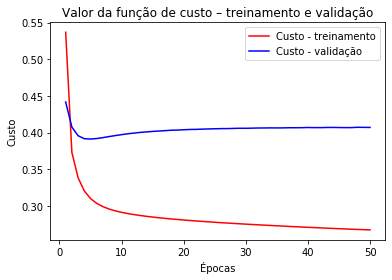

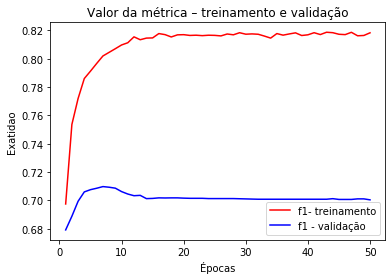

In [46]:
# Salva treinamento na variável history para visualização
history_dict = history.history
# Salva custos, métricas e epocas em vetores
custo = history_dict['loss']
metrica = history_dict['f1Score']
val_custo = history_dict['val_loss']
val_metrica = history_dict['val_f1Score']
# Cria vetor de épocas
epocas = range(1, len(custo) + 1)
# Gráfico dos valores de custo
plt.plot(epocas, custo, 'b', label='Custo - treinamento',color = 'red')
plt.plot(epocas, val_custo, 'b', label='Custo - validação')
plt.title('Valor da função de custo – treinamento e validação')
plt.xlabel('Épocas')
plt.ylabel('Custo')
plt.legend()
plt.show()
# Gráfico dos valores da métrica
plt.plot(epocas, metrica, 'b', label='f1- treinamento',color = 'red')
plt.plot(epocas, val_metrica, 'b', label='f1 - validação')
plt.title('Valor da métrica – treinamento e validação')
plt.xlabel('Épocas')
plt.ylabel('Exatidao')
plt.legend()
plt.show()

In [47]:
precision,recall,f1,yprob = choosing_threshold(new_data[1]['target'],
                                               modelf.predict(new_data[1].loc[:,'hat_xgb':'mean'])
                                                              ,np.arange(0,1,0.01))

Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0.18291783 0.81708217]
 [0.00704225 0.99295775]]
Normalized confusion matrix
[[0.35668978 0.64331022]
 [0.02548625 0.97451375]]
Normalized confusion matrix
[[0.45906476 0.54093524]
 [0.04191818 0.95808182]]
Normalized confusion matrix
[[0.53754241 0.46245759]
 [0.05767941 0.94232059]]
Normalized confusion matrix
[[0.59050007 0.40949993]
 [0.07109323 0.92890677]]
Normalized confusion matrix
[[0.62605104 0.37394896]
 [0.08551308 0.91448692]]
Normalized confusion matrix
[[0.65511137 0.34488863]
 [0.09792086 0.90207914]]
Normalized confusion matrix
[[0.68535182 0.31464818]
 [0.11167002 0.88832998]]
Normalized confusion matrix
[[0.70792152 0.29207848]
 [0.12441315 0.87558685]]
Normalized confusion matrix
[[0.72562325 0.27437675]
 [0.13715627 0.86284373]]
Normalized confusion matrix
[[0.74096474 0.25903526]
 [0.14486922 0.8

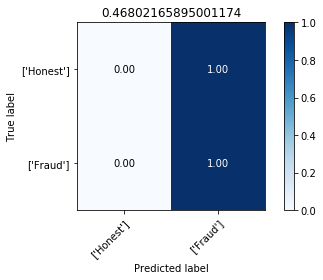

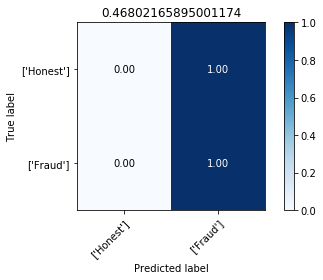

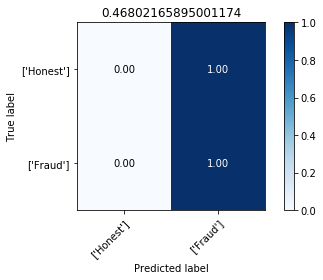

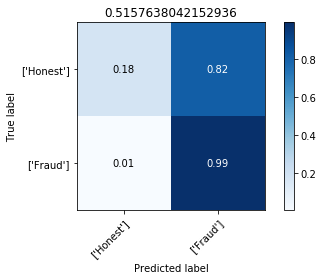

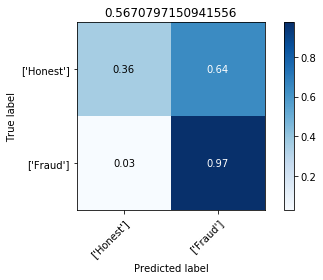

...

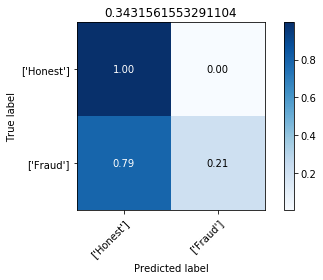

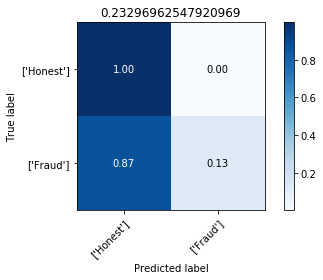

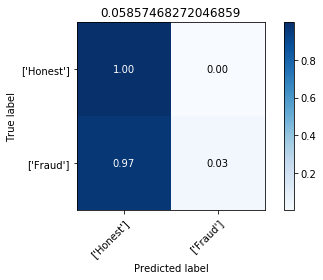

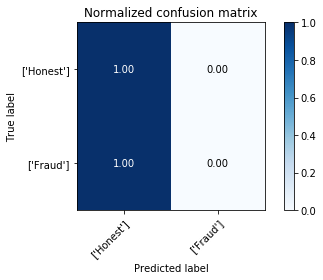

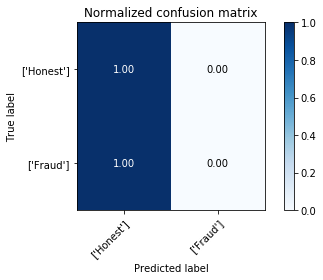

In [48]:
for i in range(len(yprob)):
    plot_confusion_matrix(y_data[1], yprob[i],
                          classes = np.array([['Honest'],['Fraud']]),
                          normalize=True,
                          title= f1[i],
                          cmap=plt.cm.Blues)

In [49]:
max(f1)

0.7213320766572415

- ## Traying a CatBoost

In [50]:
model = CatBoostClassifier(iterations=2000,eval_metric= 'F1',random_seed=42,verbose=False)
model.fit(new_data[0].loc[:,'hat_xgb':'mean'], new_data[0]['target'])

In [51]:
precision,recall,f1,yprob = choosing_threshold(new_data[1]['target'],
                                               model.predict_proba(new_data[1].loc[:,'hat_xgb':'mean'])[:,1]
                                               ,np.arange(0,1,0.01))

In [52]:
max(f1)

0.7177829099307159

# As we can see, just put the output of the threee algorithm like a input for the other one didn't have a much better result. 
# Now we will try to simply ther work for the Combiner, doing some analysis

- ## XGBoost and CatBoost predict anomaly

    - They are right in 2077 times and wrong in 801 times

In [53]:
new_data[1][(new_data[1].hat_cat == 1) & (new_data[1].hat_xgb == 1) 
            & (new_data[1].target == 1)].count()

hat_xgb      2077
prob1_xgb    2077
prob0_xgb    2077
hat_cat      2077
prob1_cat    2077
prob0_cat    2077
hat_rna      2077
prob1_rna    2077
prob0_rna    2077
geo_mean     2077
mean         2077
target       2077
dtype: int64

In [54]:
new_data[1][(new_data[1].hat_cat == 1) & (new_data[1].hat_xgb == 1) 
            & (new_data[1].target == 0)].count()

hat_xgb      801
prob1_xgb    801
prob0_xgb    801
hat_cat      801
prob1_cat    801
prob0_cat    801
hat_rna      801
prob1_rna    801
prob0_rna    801
geo_mean     801
mean         801
target       801
dtype: int64

- ## CatBoost and RNA predict non-anomaly

    - They are right in 5801 times and wrong in 755 times

In [55]:
new_data[1][(new_data[1].hat_cat == 0) & (new_data[1].hat_rna == 0) 
            & (new_data[1].target == 0)].count()

hat_xgb      5801
prob1_xgb    5801
prob0_xgb    5801
hat_cat      5801
prob1_cat    5801
prob0_cat    5801
hat_rna      5801
prob1_rna    5801
prob0_rna    5801
geo_mean     5801
mean         5801
target       5801
dtype: int64

In [56]:
new_data[1][(new_data[1].hat_cat == 0) & (new_data[1].hat_rna == 0) 
            & (new_data[1].target == 1)].count()

hat_xgb      755
prob1_xgb    755
prob0_xgb    755
hat_cat      755
prob1_cat    755
prob0_cat    755
hat_rna      755
prob1_rna    755
prob0_rna    755
geo_mean     755
mean         755
target       755
dtype: int64

# Now we will exclude this cases form the input of the Combiner

In [57]:
new_data[0].head()

,hat_xgb,prob1_xgb,prob0_xgb,hat_cat,prob1_cat,prob0_cat,hat_rna,prob1_rna,prob0_rna,geo_mean,mean,target
id,,,,,,,,,,,,
0,0.0,0.657060,0.657060,0.0,0.031772,0.968228,0.0,0.058842,0.941158,0.046877,0.249225,0.0
1,0.0,0.633083,0.633083,0.0,0.029919,0.970081,0.0,0.126966,0.873034,0.062078,0.263323,0.0
2,0.0,0.687710,0.687710,1.0,0.507097,0.492903,0.0,0.253116,0.746884,0.205193,0.482641,1.0
3,1.0,0.933945,0.933945,1.0,0.980173,0.019827,1.0,0.885128,0.114872,0.321569,0.933082,1.0
4,0.0,0.653517,0.653517,0.0,0.094978,0.905022,0.0,0.085252,0.914748,0.087249,0.277916,0.0


In [58]:
p0 = []
p1 = []
for i in range(len(new_data)):
    p0.append(new_data[i].loc[(new_data[i]['hat_cat']==0) & (new_data[i]['hat_rna']==0)])
    p1.append(new_data[i].loc[(new_data[i]['hat_cat']==1) & (new_data[i]['hat_xgb']==1)])
    new_data[i] =  new_data[i].drop(p0[i].index)
    new_data[i] =  new_data[i].drop(p1[i].index)
    p0[i]['ans'] = 0
    p1[i]['ans'] = 1

In [59]:
print(new_data[0].shape)
print(new_data[1].shape)
print(new_data[2].shape)

(1386, 12)
(327, 12)
(349, 12)


In [60]:
oversample = []
for i in range(len(new_data)):
    oversample.append(pd.concat([new_data[i]]*50, ignore_index=True)) 

## Creating the Combiner again

In [61]:
K.clear_session()

modelf = models.Sequential()
modelf.add(layers.Dense(units = 5, activation='tanh',input_shape = (11,)))
modelf.add(Dropout(0.1))
modelf.add(layers.Dense(units = 1,activation = 'sigmoid'))
modelf.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 5)                 60        
_________________________________________________________________
dropout_1 (Dropout)          (None, 5)                 0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 6         
Total params: 66
Trainable params: 66
Non-trainable params: 0
_________________________________________________________________


In [62]:
mom = optimizers.SGD(lr=0.0001, decay=0, momentum=0.9, nesterov=True)
modelf.compile(loss = 'binary_crossentropy',metrics=[f1Score],optimizer = mom)
history = modelf.fit(oversample[0].loc[:,'hat_xgb':'mean'],oversample[0]['target'],epochs = 500,batch_size=32, 
                     validation_data =(oversample[1].loc[:,'hat_xgb':'mean'],oversample[1]['target']))

Train on 69300 samples, validate on 16350 samples
Epoch 1/500
69300/69300 [==============================] - 2s 33us/step - loss: 0.5755 - f1Score: 0.0040 - val_loss: 0.7709 - val_f1Score: 0.0000e+00
Epoch 2/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.5599 - f1Score: 1.8470e-04 - val_loss: 0.7744 - val_f1Score: 0.0000e+00
Epoch 3/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.5504 - f1Score: 0.0010 - val_loss: 0.7696 - val_f1Score: 0.0000e+00
Epoch 4/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.5409 - f1Score: 0.0109 - val_loss: 0.7655 - val_f1Score: 0.0000e+00
Epoch 5/500
69300/69300 [==============================] - 2s 29us/step - loss: 0.5332 - f1Score: 0.0615 - val_loss: 0.7673 - val_f1Score: 0.0404
Epoch 6/500
69300/69300 [==============================] - 2s 30us/step - loss: 0.5267 - f1Score: 0.2206 - val_loss: 0.7680 - val_f1Score: 0.1365
Epoch 7/500
69300/69300 [=============================

69300/69300 [==============================] - 2s 26us/step - loss: 0.4853 - f1Score: 0.3804 - val_loss: 0.7584 - val_f1Score: 0.2427
Epoch 57/500
69300/69300 [==============================] - 2s 26us/step - loss: 0.4850 - f1Score: 0.3789 - val_loss: 0.7633 - val_f1Score: 0.2427
Epoch 58/500
69300/69300 [==============================] - 2s 26us/step - loss: 0.4851 - f1Score: 0.3802 - val_loss: 0.7641 - val_f1Score: 0.2427
Epoch 59/500
69300/69300 [==============================] - 2s 26us/step - loss: 0.4850 - f1Score: 0.3787 - val_loss: 0.7617 - val_f1Score: 0.2427
Epoch 60/500
69300/69300 [==============================] - 2s 26us/step - loss: 0.4850 - f1Score: 0.3768 - val_loss: 0.7684 - val_f1Score: 0.2427
Epoch 61/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4848 - f1Score: 0.3819 - val_loss: 0.7607 - val_f1Score: 0.2427
Epoch 62/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4841 - f1Score: 0.3788 - val_loss: 0.7575 - val_

Epoch 112/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4796 - f1Score: 0.3772 - val_loss: 0.7524 - val_f1Score: 0.2427
Epoch 113/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4798 - f1Score: 0.3786 - val_loss: 0.7693 - val_f1Score: 0.2427
Epoch 114/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4794 - f1Score: 0.3774 - val_loss: 0.7630 - val_f1Score: 0.2427
Epoch 115/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4797 - f1Score: 0.3797 - val_loss: 0.7698 - val_f1Score: 0.2427
Epoch 116/500
69300/69300 [==============================] - 2s 30us/step - loss: 0.4798 - f1Score: 0.3771 - val_loss: 0.7629 - val_f1Score: 0.2427
Epoch 117/500
69300/69300 [==============================] - 2s 29us/step - loss: 0.4799 - f1Score: 0.3786 - val_loss: 0.7603 - val_f1Score: 0.2427
Epoch 118/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4799 - f1Score: 0.3803 - val

69300/69300 [==============================] - 2s 27us/step - loss: 0.4781 - f1Score: 0.3777 - val_loss: 0.7593 - val_f1Score: 0.2427
Epoch 168/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4783 - f1Score: 0.3777 - val_loss: 0.7618 - val_f1Score: 0.2427
Epoch 169/500
69300/69300 [==============================] - 2s 26us/step - loss: 0.4780 - f1Score: 0.3798 - val_loss: 0.7576 - val_f1Score: 0.2427
Epoch 170/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4776 - f1Score: 0.3822 - val_loss: 0.7630 - val_f1Score: 0.2427
Epoch 171/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4778 - f1Score: 0.3824 - val_loss: 0.7682 - val_f1Score: 0.2427
Epoch 172/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4778 - f1Score: 0.3810 - val_loss: 0.7555 - val_f1Score: 0.2427
Epoch 173/500
69300/69300 [==============================] - 2s 26us/step - loss: 0.4778 - f1Score: 0.3780 - val_loss: 0.7653 

69300/69300 [==============================] - 2s 27us/step - loss: 0.4768 - f1Score: 0.3859 - val_loss: 0.7618 - val_f1Score: 0.2427
Epoch 223/500
69300/69300 [==============================] - 2s 26us/step - loss: 0.4766 - f1Score: 0.3817 - val_loss: 0.7664 - val_f1Score: 0.2427
Epoch 224/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4770 - f1Score: 0.3842 - val_loss: 0.7556 - val_f1Score: 0.2427
Epoch 225/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4771 - f1Score: 0.3820 - val_loss: 0.7508 - val_f1Score: 0.2427
Epoch 226/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4768 - f1Score: 0.3843 - val_loss: 0.7612 - val_f1Score: 0.2427
Epoch 227/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4769 - f1Score: 0.3836 - val_loss: 0.7649 - val_f1Score: 0.2427
Epoch 228/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4769 - f1Score: 0.3839 - val_loss: 0.7627 

69300/69300 [==============================] - 2s 26us/step - loss: 0.4764 - f1Score: 0.3831 - val_loss: 0.7627 - val_f1Score: 0.2427
Epoch 278/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4764 - f1Score: 0.3833 - val_loss: 0.7630 - val_f1Score: 0.2427
Epoch 279/500
69300/69300 [==============================] - 2s 26us/step - loss: 0.4766 - f1Score: 0.3834 - val_loss: 0.7672 - val_f1Score: 0.2427
Epoch 280/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4765 - f1Score: 0.3831 - val_loss: 0.7605 - val_f1Score: 0.2427
Epoch 281/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4771 - f1Score: 0.3843 - val_loss: 0.7646 - val_f1Score: 0.2427
Epoch 282/500
69300/69300 [==============================] - 2s 26us/step - loss: 0.4764 - f1Score: 0.3849 - val_loss: 0.7678 - val_f1Score: 0.2427
Epoch 283/500
69300/69300 [==============================] - 2s 26us/step - loss: 0.4766 - f1Score: 0.3844 - val_loss: 0.7618 

69300/69300 [==============================] - 2s 28us/step - loss: 0.4760 - f1Score: 0.3842 - val_loss: 0.7495 - val_f1Score: 0.2427
Epoch 333/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4763 - f1Score: 0.3832 - val_loss: 0.7645 - val_f1Score: 0.2427
Epoch 334/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4764 - f1Score: 0.3825 - val_loss: 0.7605 - val_f1Score: 0.2427
Epoch 335/500
69300/69300 [==============================] - 2s 26us/step - loss: 0.4765 - f1Score: 0.3841 - val_loss: 0.7620 - val_f1Score: 0.2427
Epoch 336/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4765 - f1Score: 0.3844 - val_loss: 0.7593 - val_f1Score: 0.2427
Epoch 337/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4766 - f1Score: 0.3835 - val_loss: 0.7732 - val_f1Score: 0.2427
Epoch 338/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4764 - f1Score: 0.3838 - val_loss: 0.7653 

69300/69300 [==============================] - 2s 27us/step - loss: 0.4760 - f1Score: 0.3841 - val_loss: 0.7608 - val_f1Score: 0.2427
Epoch 388/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4759 - f1Score: 0.3833 - val_loss: 0.7605 - val_f1Score: 0.2427
Epoch 389/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4755 - f1Score: 0.3849 - val_loss: 0.7681 - val_f1Score: 0.2427
Epoch 390/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4761 - f1Score: 0.3821 - val_loss: 0.7598 - val_f1Score: 0.2427
Epoch 391/500
69300/69300 [==============================] - 2s 26us/step - loss: 0.4757 - f1Score: 0.3831 - val_loss: 0.7640 - val_f1Score: 0.2427
Epoch 392/500
69300/69300 [==============================] - 2s 26us/step - loss: 0.4757 - f1Score: 0.3832 - val_loss: 0.7622 - val_f1Score: 0.2427
Epoch 393/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4759 - f1Score: 0.3850 - val_loss: 0.7701 

69300/69300 [==============================] - 2s 27us/step - loss: 0.4756 - f1Score: 0.3842 - val_loss: 0.7612 - val_f1Score: 0.2427
Epoch 443/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4761 - f1Score: 0.3840 - val_loss: 0.7640 - val_f1Score: 0.2427
Epoch 444/500
69300/69300 [==============================] - 2s 26us/step - loss: 0.4759 - f1Score: 0.3830 - val_loss: 0.7774 - val_f1Score: 0.2427
Epoch 445/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4759 - f1Score: 0.3816 - val_loss: 0.7643 - val_f1Score: 0.2427
Epoch 446/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4757 - f1Score: 0.3843 - val_loss: 0.7577 - val_f1Score: 0.2427
Epoch 447/500
69300/69300 [==============================] - 2s 26us/step - loss: 0.4762 - f1Score: 0.3815 - val_loss: 0.7582 - val_f1Score: 0.2427
Epoch 448/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4757 - f1Score: 0.3845 - val_loss: 0.7711 

69300/69300 [==============================] - 2s 26us/step - loss: 0.4761 - f1Score: 0.3852 - val_loss: 0.7617 - val_f1Score: 0.2427
Epoch 498/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4759 - f1Score: 0.3853 - val_loss: 0.7661 - val_f1Score: 0.2427
Epoch 499/500
69300/69300 [==============================] - 2s 26us/step - loss: 0.4768 - f1Score: 0.3850 - val_loss: 0.7660 - val_f1Score: 0.2427
Epoch 500/500
69300/69300 [==============================] - 2s 27us/step - loss: 0.4762 - f1Score: 0.3835 - val_loss: 0.7676 - val_f1Score: 0.2427


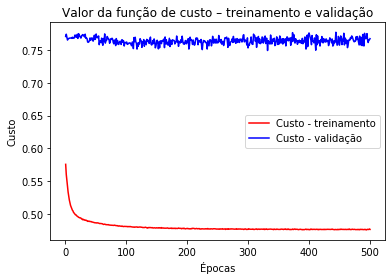

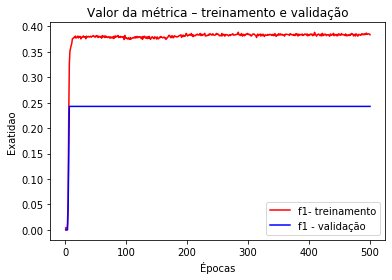

In [63]:
# Salva treinamento na variável history para visualização
history_dict = history.history
# Salva custos, métricas e epocas em vetores
custo = history_dict['loss']
metrica = history_dict['f1Score']
val_custo = history_dict['val_loss']
val_metrica = history_dict['val_f1Score']
# Cria vetor de épocas
epocas = range(1, len(custo) + 1)
# Gráfico dos valores de custo
plt.plot(epocas, custo, 'b', label='Custo - treinamento',color = 'red')
plt.plot(epocas, val_custo, 'b', label='Custo - validação')
plt.title('Valor da função de custo – treinamento e validação')
plt.xlabel('Épocas')
plt.ylabel('Custo')
plt.legend()
plt.show()
# Gráfico dos valores da métrica
plt.plot(epocas, metrica, 'b', label='f1- treinamento',color = 'red')
plt.plot(epocas, val_metrica, 'b', label='f1 - validação')
plt.title('Valor da métrica – treinamento e validação')
plt.xlabel('Épocas')
plt.ylabel('Exatidao')
plt.legend()
plt.show()

In [64]:
precision,recall,f1_rna,yprob = choosing_threshold(new_data[1]['target'],
                                               modelf.predict(new_data[1].loc[:,'hat_xgb':'mean'])
                                                              ,np.arange(0,1,0.01))

In [65]:
max(f1_rna)

0.6732673267326733

Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0.00564972 0.99435028]
 [0.         1.        ]]
Normalized confusion matrix
[[0.03389831 0.96610169]
 [0.         1.        ]]
Normalized confusion matrix
[[0.06779661 0.93220339]
 [0.00666667 0.99333333]]
Normalized confusion matrix
[[0.0960452  0.9039548 ]
 [0.01333333 0.98666667]]
Normalized confusion matrix
[[0.1299435  0.8700565 ]
 [0.02666667 0.97333333]]
Normalized confusion matrix
[[0.17514124 0.82485876]
 [0.04       0.96      ]]
Normalized confusion matrix
[[0.23728814 0.76271186]
 [0.05333333 0.94666667]]
Normalized confusion matrix
[[0.28248588 0.71751412]
 [0.09333333 0.90666667]]
Normalized confusion matrix
[[0.33333333 0.66666667]
 [0.09333333 0.90666667]]
Normalized confusion matrix
[[0.36723164 0.63276836]
 

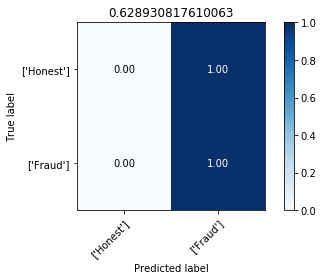

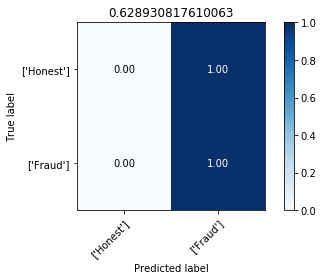

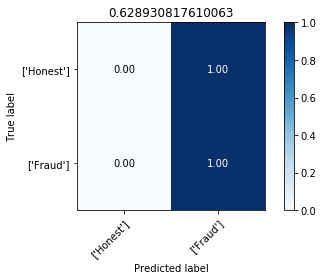

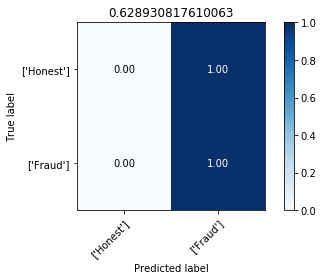

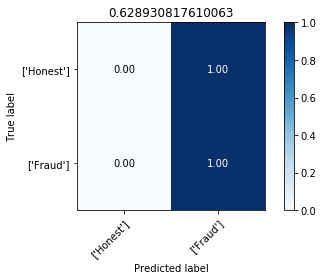

...

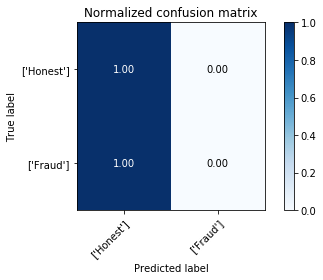

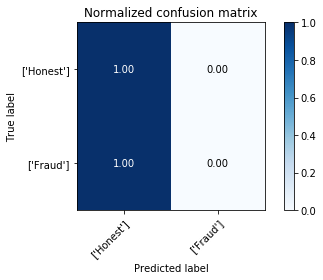

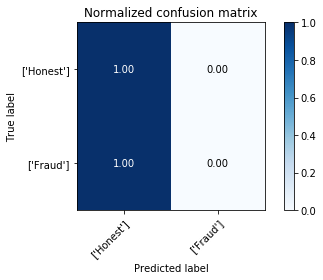

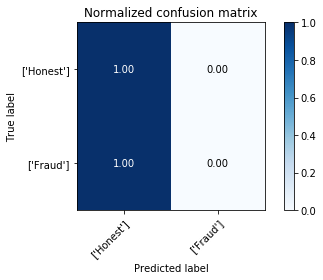

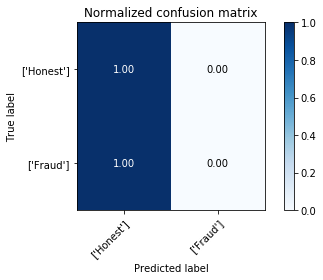

In [66]:
for i in range(len(yprob)):
    plot_confusion_matrix(new_data[1]['target'].astype(int), yprob[i],
                          classes = np.array([['Honest'],['Fraud']]),
                          normalize=True,
                          title= f1_rna[i],
                          cmap=plt.cm.Blues)

- ## Traying a CatBoost

In [67]:
model = CatBoostClassifier(iterations=2000,eval_metric= 'F1',random_seed=42,verbose=False)
model.fit(oversample[0].loc[:,'hat_xgb':'mean'], oversample[0]['target'])

In [68]:
precision,recall,f1_cat,yprob = choosing_threshold(new_data[1]['target'],
                                               model.predict_proba(new_data[1].loc[:,'hat_xgb':'mean'])[:,1]
                                               ,np.arange(0,1,0.01))

Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0.36723164 0.63276836]
 [0.20666667 0.79333333]]
Normalized confusion matrix
[[0.45762712 0.54237288]
 [0.31333333 0.68666667]]
Normalized confusion matrix
[[0.52542373 0.47457627]
 [0.37333333 0.62666667]]
Normalized confusion matrix
[[0.56497175 0.43502825]
 [0.44       0.56      ]]
Normalized confusion matrix
[[0.5819209 0.4180791]
 [0.48      0.52     ]]
Normalized confusion matrix
[[0.60451977 0.39548023]
 [0.52666667 0.47333333]]
Normalized confusion matrix
[[0.63841808 0.36158192]
 [0.55333333 0.44666667]]
Normalized confusion matrix
[[0.65536723 0.34463277]
 [0.56666667 0.43333333]]
Normalized confusion matrix
[[0.68361582 0.31638418]
 [0.58       0.42      ]]
Normalized confusion matrix
[[0.70056497 0.29943503]
 [0.58       0.42      ]]
Normalized confusion matrix
[[0.71186441 0.28813559]
 [0.58666667 0.41333333]]
Normalized confusion matrix
[[0.72316384 0.27683616]
 [0.60666667 0.39333333]]
Normalize

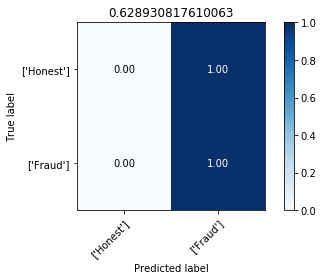

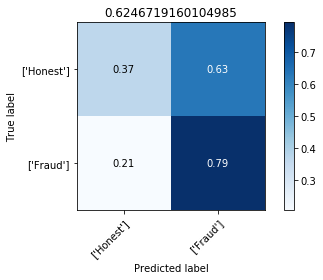

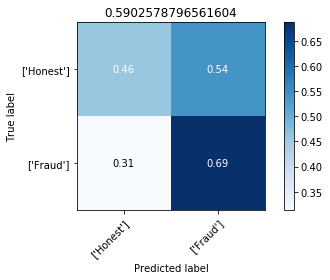

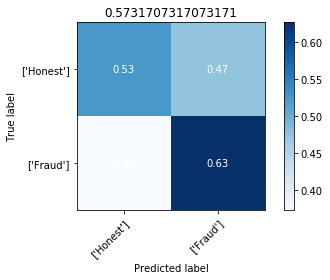

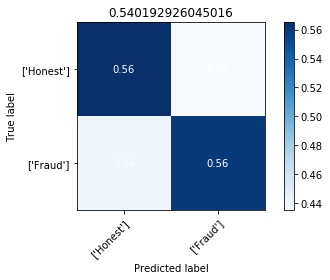

...

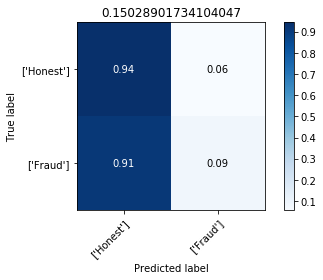

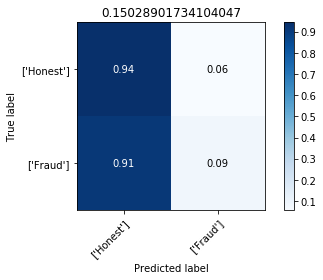

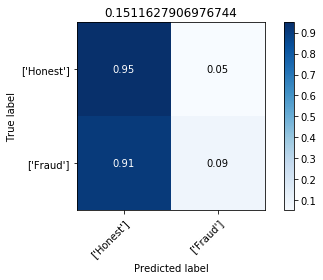

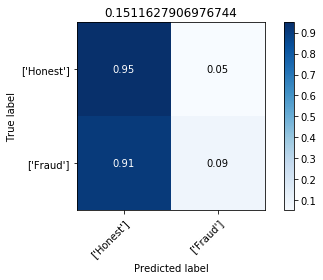

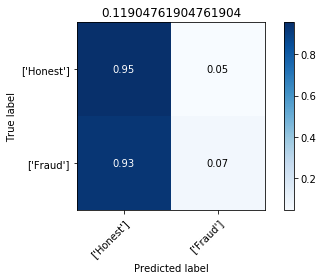

In [69]:
for i in range(len(yprob)):
    plot_confusion_matrix(new_data[1]['target'].astype(int), yprob[i],
                          classes = np.array([['Honest'],['Fraud']]),
                          normalize=True,
                          title= f1_cat[i],
                          cmap=plt.cm.Blues)

In [70]:
max(f1)

0.7177829099307159

# Putting the answer of the combiner in the dataFrame

In [71]:
for i in range(len(oversample)):
    new_data[i]['ans'] = predict_threshold(modelf.predict_proba(new_data[i].loc[:,'hat_xgb':'mean']),
                                           threshold_list[f1_rna.index(max(f1_rna))])

# Putting the P0 and P1 together

In [72]:
p = []
for i in range(len(p0)):
    aux = pd.concat([p0[i],p1[i]])
    aux = aux.sort_index()
    p.append(aux)

# Putting all the answers together


In [73]:
for i in range(len(p)):
    new_data[i] = (pd.concat([new_data[i],p[i]])).sort_index()

In [74]:
new_data[0].head()

,hat_xgb,prob1_xgb,prob0_xgb,hat_cat,prob1_cat,prob0_cat,hat_rna,prob1_rna,prob0_rna,geo_mean,mean,target,ans
id,,,,,,,,,,,,,
0,0.0,0.657060,0.657060,0.0,0.031772,0.968228,0.0,0.058842,0.941158,0.046877,0.249225,0.0,0
1,0.0,0.633083,0.633083,0.0,0.029919,0.970081,0.0,0.126966,0.873034,0.062078,0.263323,0.0,0
2,0.0,0.687710,0.687710,1.0,0.507097,0.492903,0.0,0.253116,0.746884,0.205193,0.482641,1.0,1
3,1.0,0.933945,0.933945,1.0,0.980173,0.019827,1.0,0.885128,0.114872,0.321569,0.933082,1.0,1
4,0.0,0.653517,0.653517,0.0,0.094978,0.905022,0.0,0.085252,0.914748,0.087249,0.277916,0.0,0


# Evaluating the combiner

Normalized confusion matrix
[[0.91124411 0.08875589]
 [0.17639154 0.82360846]]
Normalized confusion matrix
[[0.86443428 0.13556572]
 [0.25788062 0.74211938]]
Normalized confusion matrix
[[0.86762972 0.13237028]
 [0.2606651  0.7393349 ]]


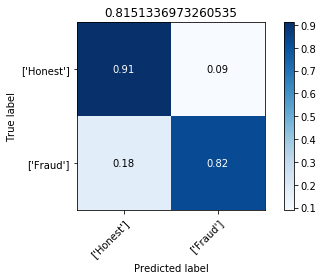

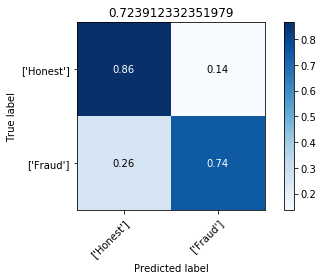

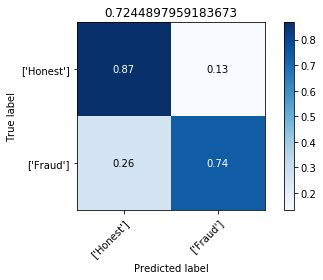

In [75]:
for i in range(len(new_data)):
    plot_confusion_matrix(new_data[i]['target'].astype(int), new_data[i]['ans'].astype(int),
                          classes = np.array([['Honest'],['Fraud']]),
                          normalize=True,
                          title= f1_score(new_data[i]['target'].astype(int), new_data[i]['ans'].astype(int)),
                          cmap=plt.cm.Blues)